In [4]:
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))

from c3s_event_attribution_tools import *

import requests
import urllib.parse
import matplotlib.pyplot as plt
import cartopy 
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
import json
import geopandas as gpd
import rasterio
from rasterio import features
from shapely.geometry import shape, Polygon, mapping, MultiPolygon, GeometryCollection
from shapely.vectorized import contains # replace with below
from shapely import contains_xy
import xarray as xr
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from shapely.ops import unary_union
from datetime import datetime, timedelta
import pandas as pd
import contextily as ctx
import math
import regionmask
import matplotlib.dates as mdates
from matplotlib.patches import Rectangle
import cmocean
import base64
from io import BytesIO
import contextily as ctx
from typing import Union, Literal



In [5]:
# api key used for the DataClient
# replace with your own API key from the C3S Climate Data Store
your_api_key = '98256e82-4de4-4cc1-8087-faebb5c2e4ae'

In [6]:
# Climatology data

# retrieve 1950-event
# make cutouts for specicic date ranges

# bounding box (-lon, -lat, +lon, +lat)
bbox = (0, 40, 15, 55)

event_date = datetime(2024, 7, 10)
event_start_date = event_date - timedelta(days=14)

climatology_start_date_1950 = datetime(1950, 1, 1)
climatology_start_date_1991 = datetime(1991, 1, 1)
climatology_end_date_2020 = datetime(2020, 12, 31)
climatology_gdf_1950_event = DataClient(your_api_key, beacon_cache_url='https://beacon-development.maris.nl').temperature_2m_mean(bbox, (climatology_start_date_1950, event_date))

# make sure the climatology data is sorted by valid_time (necessary when data is fetched in multiple chunks)
climatology_gdf_1950_event = climatology_gdf_1950_event.sort_values(by='valid_time')


Connected to: https://beacon-development.maris.nl/ server successfully
Connected to: https://beacon-development.maris.nl/ server successfully
Fetching data from beacon cache...
Beacon Bbox: (0.0, 40, 15.0, 55)
Running query: {"from": "era5_daily_mean_2m_temperature", "select": [{"column": "longitude", "alias": null}, {"column": "latitude", "alias": null}, {"column": "valid_time", "alias": null}, {"column": "t2m", "alias": null}], "filters": [{"and": [{"column": "longitude", "gt_eq": 0.0, "lt_eq": null}, {"column": "longitude", "gt_eq": null, "lt_eq": 15.0}, {"column": "latitude", "gt_eq": 40, "lt_eq": null}, {"column": "latitude", "gt_eq": null, "lt_eq": 55}]}, {"column": "valid_time", "gt_eq": "1950-01-01T00:00:00.000000", "lt_eq": "2024-07-10T00:00:00.000000"}], "output": {"format": "parquet"}}
Beacon cache covers time range: 1951-01-01 00:00:00 - 2024-07-10 00:00:00
Requesting missing data from CDS for range: 1950-01-01 00:00:00 - 1951-01-01 00:00:00


2025-10-03 10:07:15,416 INFO Request ID is c64e7e42-7b8d-4704-92be-b484324d44d9
2025-10-03 10:07:15,479 INFO status has been updated to accepted
2025-10-03 10:08:31,180 INFO status has been updated to running
2025-10-03 10:21:35,221 INFO status has been updated to successful


2e5b968e8ca19c891977e401e5927747.nc:   0%|          | 0.00/2.86M [00:00<?, ?B/s]

2025-10-03 10:21:40,588 INFO Request ID is e27e7b15-2b52-410a-829c-14369f70308d
2025-10-03 10:21:40,642 INFO status has been updated to accepted
2025-10-03 10:21:54,325 INFO status has been updated to running
2025-10-03 10:22:13,555 INFO status has been updated to successful


1633b4f7a45fbdede668bb2a5b12314b.nc:   0%|          | 0.00/30.9k [00:00<?, ?B/s]

In [11]:
# drop number column
# climatology_gdf_1950_event = climatology_gdf_1950_event.drop(columns=['number'])

event_gdf = climatology_gdf_1950_event[(climatology_gdf_1950_event['valid_time'] >= event_start_date) & (climatology_gdf_1950_event['valid_time'] <= event_date)]

climatology_gdf_1991_2020 = climatology_gdf_1950_event[(climatology_gdf_1950_event['valid_time'] >= climatology_start_date_1991) & (climatology_gdf_1950_event['valid_time'] <= climatology_end_date_2020)]

In [13]:
#2.1
# split dataframe into daily GeoDataFrames
daily_gdfs = {}
for date, gdf in event_gdf.groupby(event_gdf['valid_time'].dt.date):
    daily_gdfs[date] = gdf

# or make a selection of the data for a specific date range
event_gdf_sd = event_gdf[(event_gdf['valid_time'] >= event_date) & (event_gdf['valid_time'] <= event_date)]

event_gdf_sd

,longitude,latitude,valid_time,t2m,geometry
99926216,10.0,50.50,2024-07-10,20.367249,POINT (10 50.5)
99926215,10.0,50.25,2024-07-10,20.855042,POINT (10 50.25)
99926214,10.0,50.00,2024-07-10,21.305817,POINT (10 50)
99926213,10.0,49.75,2024-07-10,21.624023,POINT (10 49.75)
99926210,10.0,49.00,2024-07-10,20.467285,POINT (10 49)
...,...,...,...,...,...
99924980,5.0,46.50,2024-07-10,21.748444,POINT (5 46.5)
99924981,5.0,46.75,2024-07-10,21.592529,POINT (5 46.75)
99924982,5.0,47.00,2024-07-10,21.400055,POINT (5 47)
99924970,5.0,44.00,2024-07-10,25.651764,POINT (5 44)


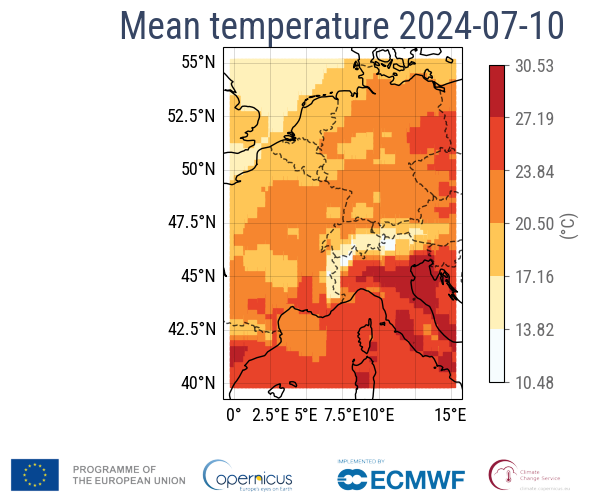

In [16]:
#2.1/2.2

# Temperature
fig, ax, img_ax = plot_gdf(
    event_gdf_sd,
    title=f"Mean temperature {event_date.strftime('%Y-%m-%d')}",
    legend_title="(°C)",
    value_col='t2m',
)
# Precipitation
# fig, ax = plot_gdf(gdf_selection, title=f"Total precipitation {eventDate.strftime('%Y-%m-%d')}", legend_title="(mm)", value_col='tp', cmap=cmocean.cm.rain)


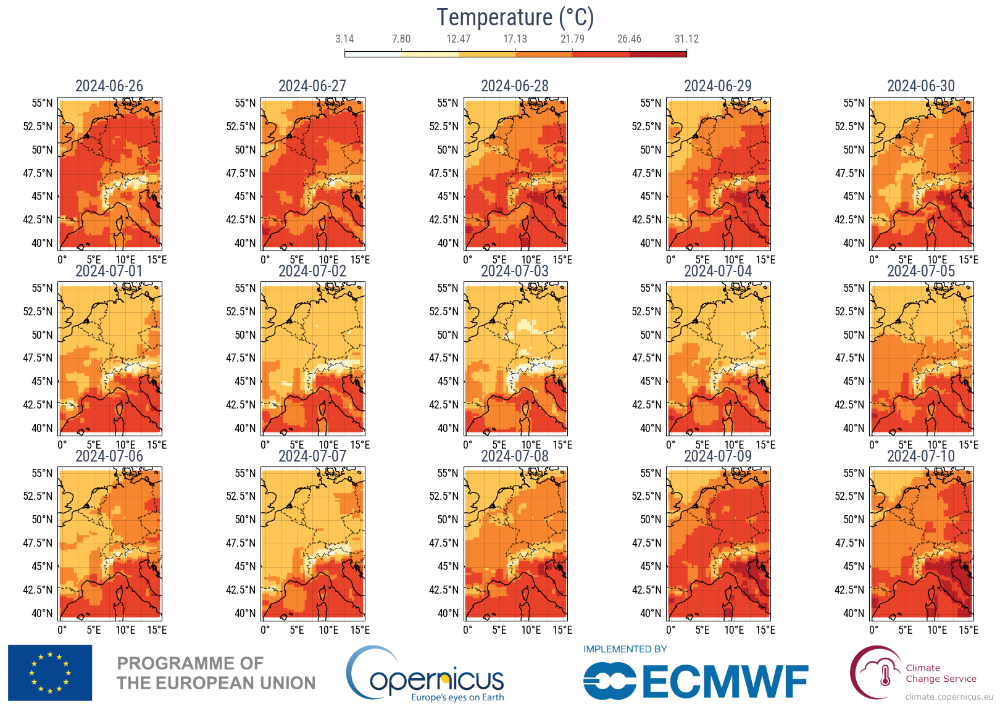

In [17]:
#2.2 a.i

# Temperature
fig, axes, img_axes = subplot_gdf(
    event_gdf,
    datetime_col='valid_time',
    value_col='t2m',
    ncols=5,
    legend_title='Temperature (°C)',
    #suptitle='Mean temperature over 15 days'
)

# # Precipitation
# fig, axes = subplot_gdf(
#     gdfs,
#     datetime_col='valid_time',
#     value_col='tp',
#     ncols=5,
#     cmap=cmocean.cm.rain,
#     legend_title='Precipitation (mm)',
#     #suptitle='Total precipitation over 15 days'
# )

#plt.show()


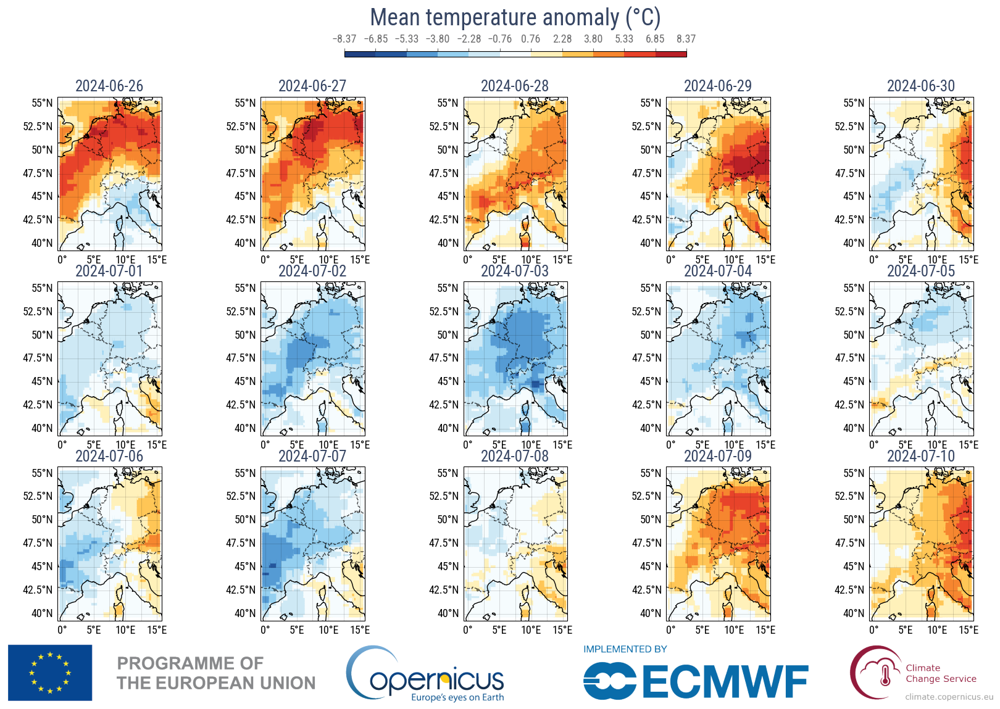

In [19]:
# 2.2 Calculate and show anomaly

# calculate mean climatology for the days surrounding the event date
climatology_gdf_1991_2020_31d = calculate_mean_gdf(
    gdf=climatology_gdf_1991_2020,
    date_range=event_gdf['valid_time'].unique(),
    padding=15,
    value_col='t2m',
    datetime_col='valid_time'
    )

# print(mean_climatology_gdf)

# calculate anomaly for the event period compared to the mean climatology
event_gdf_anomaly = calculate_anomaly(
    event_gdf=event_gdf,
    mean_climatology_gdf=climatology_gdf_1991_2020_31d,
    value_col='t2m',
    datetime_col='valid_time',
    calcation='absolute'
)

# print(anomaly_gdf)

# plot anomaly
fig, axes, img_axes = subplot_gdf(
    event_gdf_anomaly,
    datetime_col='valid_time',
    value_col='t2m',
    ncols=5,
    legend_title='Mean temperature anomaly (°C)',
    #suptitle='Total precipitation over 15 days'
)


In [20]:
# 2.2 d
regionType = 'wraf' # 'wraf' or 'hydrobasin'

# pick a single day and create a figure
selected_date = datetime(2024,7,3)
img_base64 = get_base_fig(selected_date, event_gdf_anomaly, value_col='t2m')

# turn bbox into a string
sbbox = ",".join(map(str, bbox))

# create params for region picker, includes bbox and image overlay of picked day
params = {
    "bbox": sbbox,
    "image": 'data:image/png;base64,'+img_base64    # image overlay needs the following prefix to work
}

# select region (opens web browser)
result = select_region(regionType, params)

# interpret the result as JSON
data = json.loads(result)

# convert data to polygons and coordinates
polygons, coords = data_2_poly(data)

The region picker will shortly open in your web browser. Please select a region, close the browser tab and return to the notebook when done.
Failed to start Region Picker for wraf. Status code: 500
Response: <!-- Warning: Undefined array key &quot;images&quot; (500 Internal Server Error) -->
<!DOCTYPE html>
<html lang="en">
    <head>
        <meta charset="UTF-8" />
        <meta name="robots" content="noindex,nofollow" />
        <meta name="viewport" content="width=device-width,initial-scale=1" />
        <title>Warning: Undefined array key &quot;images&quot; (500 Internal Server Error)</title>
        <link rel="icon" type="image/png" href="" />
        <style>/* This file is based on WebProfilerBundle/Resources/views/Profiler/profiler.css.twig.
   If you make any change in this file, verify the same change is needed in the other file. */
:root {
    --font-sans-serif: Helvetica, Arial, sans-serif;
    --page-background: #f9f9f9;
    --color-text: #222;
    /* when updating any of 

TypeError: the JSON object must be str, bytes or bytearray, not NoneType

c:\Python310\lib\site-packages\xarray\coding\times.py:213: SerializationWarning: Ambiguous reference date string: 1-1-1 0:0:0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 0:0:0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  ref_date = _ensure_padded_year(ref_date)
C:\Users\jasper\AppData\Local\Temp\ipykernel_25404\1725737792.py:3: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates prior reform date (1582-10-15). To silence this warning specify 'use_cftime=True'.
  elevation_nc = xr.open_dataset("../data/elev.0.25-deg.nc")


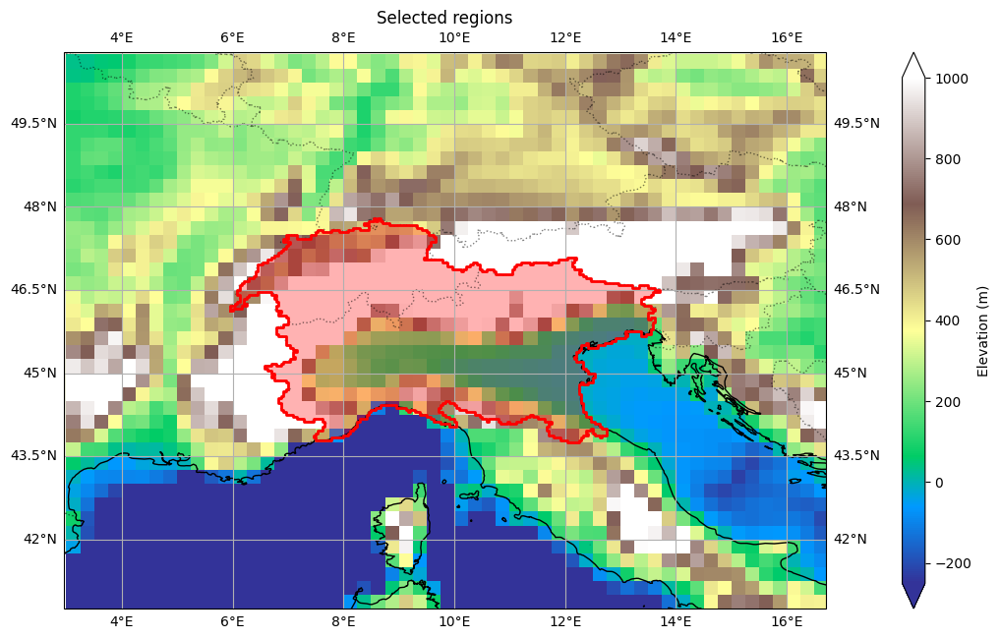

In [ ]:
#2.2 d/e
# load elevation data from a NetCDF file
elevation_nc = xr.open_dataset("../data/elev.0.25-deg.nc")
elevation = wrap_lon(elevation_nc)['data']

# plot polygon, elevation is optional
fig, ax = plot_poly(polygons, coords, elevation=elevation)

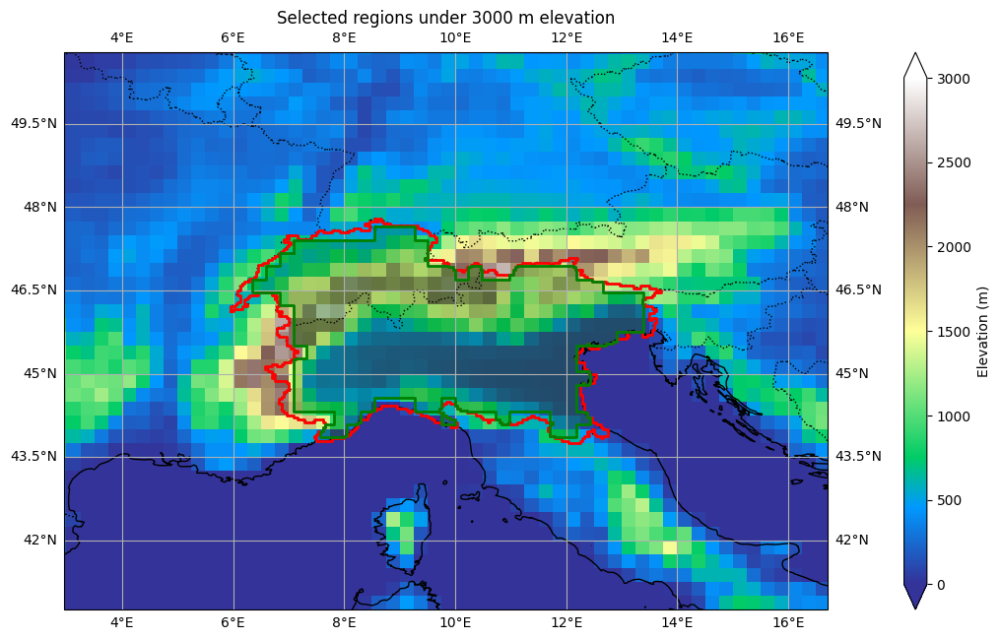

In [ ]:
#2.2 e
# plot polygons based on selected region and elevation threshold
elevation_threshold = 3000  # meters
fig, ax, adjusted_polygons = elevation_region(data, polygons, elevation, elevation_threshold)

In [ ]:
# 2.2 e
# write polygons to a shapefile
multipoly = unary_union(adjusted_polygons)
studyregion_gdf = gpd.GeoDataFrame(index=[0], crs='EPSG:4326', geometry=[multipoly])    # is this using the correct CRS?
studyregion_gdf.to_file("..\data\sf_studyregion.shp")

polygons_gdf = gpd.GeoDataFrame(geometry=polygons, crs="EPSG:4326")
polygons_gdf.to_file("..\data\sf_polygons.shp")

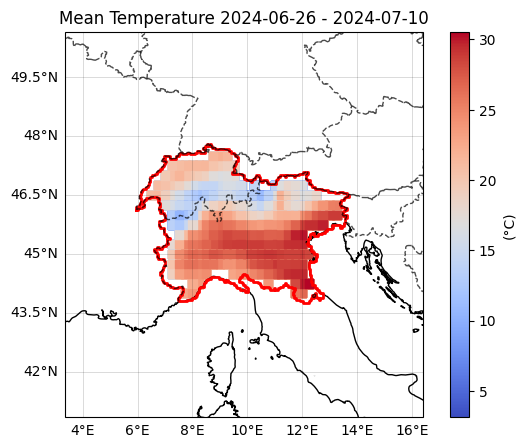

In [ ]:
#2.2 e
# intersect gdf with polygons we created to only display data for the selected region and elevation

# load poly shape used for intersecting the gdf
poly_shp = gpd.read_file("..\data\sf_studyregion.shp")
poly_gdf = gpd.GeoDataFrame(geometry=poly_shp.geometry, crs=poly_shp.crs)

# load polygon used for displaying the polygons on the map
polygons_shp = gpd.read_file("..\data\sf_polygons.shp")  # or .shp
polygons = list(polygons_shp.geometry)

# intersect the data to only show data for the selected region
intersected_gdf = gpd.overlay(event_gdf, poly_gdf, how='intersection')

# optional extends for a bigger area for the plot
min_lon, min_lat, max_lon, max_lat = poly_gdf.total_bounds
extends = [min_lon - 3, max_lon + 3, min_lat - 3, max_lat + 3]

# display the intersection results
fig, ax = plot_gdf(intersected_gdf, title=f"Mean Temperature {event_start_date.strftime('%Y-%m-%d')} - {event_date.strftime('%Y-%m-%d')}", legend_title="(°C)", value_col='t2m', cmap='coolwarm', extends=extends, polygons=polygons)
# Maybe add some padding to the results, this should be done in plot.py
# using the same color gradient as in the other figures gives a poor impression because we have a different data selection (mix, max values)

In [ ]:
#2.3

# Ik weet niet zeker wat ze hier nou precies opgeslagen willen hebben? is dit de polygon? Is dit de data die al uitgesneden is dmv de polygon?

# save the study domain (as shapefile)
intersected_gdf.to_file("..\data\sf_studyregion_elev.shp")

# Create a new bbox from the selected study region
intersected_bbox = intersected_gdf.total_bounds

c:\Python310\lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Field valid_time create as date field, though DateTime requested.
  ogr_write(


In [ ]:
# 2.4
# average the study domain

# intersect for study domain
climatology_2_event_gdf_intersected = gpd.overlay(climatology_gdf_1950_event, poly_gdf, how='intersection')

# save the study domain (as shapefile)
climatology_2_event_gdf_intersected.to_file("..\data\climatology_2_event_gdf_intersected.shp")

print(climatology_2_event_gdf_intersected)

c:\Python310\lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Field valid_time create as date field, though DateTime requested.
  ogr_write(


         longitude  latitude valid_time        t2m  number            geometry
0             8.25     45.00 1950-01-01   0.675537     0.0     POINT (8.25 45)
1             8.50     45.00 1950-01-01   0.989838     0.0      POINT (8.5 45)
2             8.75     45.00 1950-01-01   1.444763     0.0     POINT (8.75 45)
3             9.00     45.00 1950-01-01   1.163818     0.0        POINT (9 45)
4             9.25     45.00 1950-01-01   0.803406     0.0     POINT (9.25 45)
...            ...       ...        ...        ...     ...                 ...
6778024       6.75     46.75 2024-07-10  20.959045     NaN  POINT (6.75 46.75)
6778025       7.00     46.25 2024-07-10  17.087891     NaN     POINT (7 46.25)
6778026       7.00     46.50 2024-07-10  19.179688     NaN      POINT (7 46.5)
6778027       7.00     46.75 2024-07-10  20.491608     NaN     POINT (7 46.75)
6778028       7.00     47.00 2024-07-10  19.824707     NaN        POINT (7 47)

[6778029 rows x 6 columns]


In [ ]:
# mean temperature per time step for intersected climatology gdf
mean_climatology_2_event_gdf_intersected = climatology_2_event_gdf_intersected.groupby("valid_time")["t2m"].mean().reset_index()

print(mean_climatology_2_event_gdf_intersected)

      valid_time        t2m
0     1950-01-01  -3.647483
1     1950-01-02  -4.397512
2     1950-01-03  -1.582688
3     1950-01-04  -1.146600
4     1950-01-05  -0.541688
...          ...        ...
27215 2024-07-06  18.662346
27216 2024-07-07  17.637941
27217 2024-07-08  19.716541
27218 2024-07-09  21.817123
27219 2024-07-10  22.504593

[27220 rows x 2 columns]


In [ ]:
# 2.4
# Optional: save to NetCDF
mean_climatology_2_event_gdf_intersected.to_xarray().to_netcdf("../data/mean_temperature.nc")
# OR CSV
mean_climatology_2_event_gdf_intersected.to_csv("../data/mean_temperature.csv")

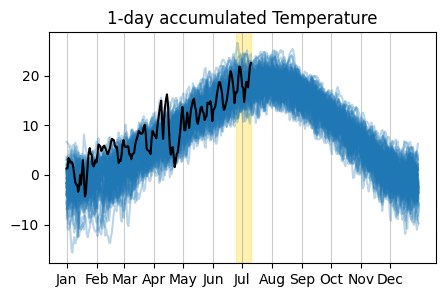

In [ ]:
# 2.4
# Single 1-day plot

# creating labels and intersecting with polygons
labelticks = pd.date_range("2000-01-01", "2000-12-31", freq="MS").dayofyear
labels = pd.date_range("2000-01-01", "2000-12-31", freq="MS").strftime("%b")

# plot a single day
fig, axs = plot_n_day_accumulations(
    [mean_climatology_2_event_gdf_intersected], 
    value_col='t2m',
    parameter="Temperature",
    event_date=event_date,
    labelticks=labelticks,
    labels=labels,
    days=[1],
    ylimit=None
)

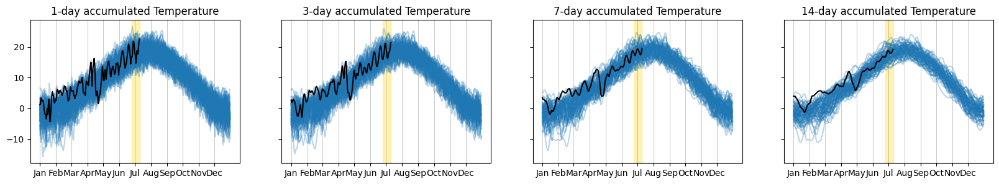

In [ ]:
# 2.5

# choose windows
# temperature (t2m): days = [1, 3, 7, 14]
# preticipation (tp): days = [1, 3, 5, 10]
# else days = [1, 3, 5, 11]

# creating labels and intersecting with polygons
labelticks = pd.date_range("2000-01-01", "2000-12-31", freq="MS").dayofyear
labels = pd.date_range("2000-01-01", "2000-12-31", freq="MS").strftime("%b")

# temperature rolling days
days = [1, 3, 7, 14]

# create a list of rolled days for the climatology
rolled_data_list = [n_day_accumulations_gdf(gdf = mean_climatology_2_event_gdf_intersected, value_col='t2m', datetime_col='valid_time', padding=d, centering=False, method='mean') for d in days]

# plot the rolled days
fig, axs = plot_n_day_accumulations(
    rolled_data_list, 
    value_col='t2m',
    parameter="Temperature",
    event_date=event_date,
    labelticks=labelticks,
    labels=labels,
    days=days,
    ylimit=None
)

Ik weet niet wat ze nou precies willen met die n-day accumilations, want ik heb nu ieder jaar geplot zonder de standard deviation, die staat namelijk niet in het workflow.
Als ze standaard deviation willen, willen ze dan de 30-year climtologie gegroepeerd op 1 dag? dus bv voor 1 januari de mean van alle jaren 1991-2020? en dan ook nog eens de standard diviation?
Want zoals ik het in de code van Izidine staat rekend hij alleen de mean, standard deviation of custom deviation uit, lost van elkaar.

Originele workflow + voorbeeld code verschilt te veel met extra uitleg email. voor nu zo laten.

In [ ]:
#2.6
# rolling mean 

# temporal rolling 31 day mean for study domain. This uses the mean climatology gdf that was already averaged over the study domain and returns a single time series
mean_climatology_gdf_intersected_temporal = n_day_accumulations_gdf(gdf = mean_climatology_2_event_gdf_intersected, value_col='t2m', datetime_col='valid_time', padding=31, centering=True, method='mean')

# remove leap days if you want a 365-day climatology
gdf = mean_climatology_gdf_intersected_temporal[~((mean_climatology_gdf_intersected_temporal["valid_time"].dt.month == 2) & (mean_climatology_gdf_intersected_temporal["valid_time"].dt.day == 29))]

# compute day of year
gdf["doy"] = gdf["valid_time"].dt.dayofyear

# group by DOY and average
daily_means = gdf.groupby("doy")["t2m"].mean()

# create a date index for the final year in dataset
final_year = gdf["valid_time"].dt.year.max()
date_index = pd.date_range(start=f"{final_year}-01-01", end=f"{final_year}-12-31")

# align with daily_means
mean_climatology_gdf_intersected_temporal_mean = pd.DataFrame({
    "valid_time": date_index,
    "t2m": daily_means.values
})

print(mean_climatology_gdf_intersected_temporal_mean)
# save to file
#mean_climatology_gdf_intersected_temporal.to_file("../data/mean_temperature_intersected_temporal.shp", driver='ESRI Shapefile')
# OR CSV
#mean_climatology_gdf_intersected_temporal.to_csv("../data/mean_temperature_intersected_temporal.csv")

# spatial rolling 31 day mean for study domain. This uses the climatology gdf that has not been averaged over the study domain and returns a gdf with the same structure as the input
#mean_climatology_gdf_intersected_spatial = n_day_accumulations_gdf(gdf = climatology_2_event_gdf_intersected, value_col='t2m', datetime_col='valid_time', padding=31, centering=False, method='mean', group_by=['latitude', 'longitude', 'geometry'])
#print(mean_climatology_gdf_intersected_spatial)
# save to file
#mean_climatology_gdf_intersected_spatial.to_file("../data/mean_temperature_intersected_spatial.shp", driver='ESRI Shapefile')
# OR CSV
#mean_climatology_gdf_intersected_spatial.to_csv("../data/mean_temperature_intersected_spatial.csv")


    valid_time       t2m
0   2024-01-01 -1.229430
1   2024-01-02 -1.258027
2   2024-01-03 -1.283591
3   2024-01-04 -1.306167
4   2024-01-05 -1.325075
..         ...       ...
361 2024-12-27 -1.058367
362 2024-12-28 -1.102081
363 2024-12-29 -1.142306
364 2024-12-30 -1.178865
365 2024-12-31 -1.792319

[366 rows x 2 columns]


C:\Users\jasper\AppData\Local\Temp\ipykernel_15600\1455779755.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf["doy"] = gdf["valid_time"].dt.dayofyear


2.7 Decide on the temporal extent using Step 2.2 and the following considerations:

    a. As much related to impacts as possible
        i. e.g. TXx max Temperature 1-day (outdoor workers), 
           T3x mean Temperature 3-day (people indoors)
        ii. e.g. flooding: precipitation averaged over duration 
            or over response time basin
        iii. e.g. drought: precipitation values (or soil moisture) 
             averaged over several months or multiple rainy seasons

    b. Seasonality
        i. OPTIONAL: Use information from literature review 
           (see also Sec. 6a.), specifically for information on seasonality, 
           that can feed into the choice of event definition. 
        ii. Make use of seasonal cycle plot 
        iii. Restrict to some months if necessary, if event occurred 
             outside of the usual season or a change in seasonality is suspected, 
             e.g. May-June maximum 4-day precipitation
        iv. Potentially take temperature anomalies rather than absolute values 
            if averaging over months where the seasonal cycle is in transition 
            between peaks and troughs

    c. Make use of the plots created in Step 2.5.

2.8 Make a final decision on the event definition. Update the output table 
    in the tables document (apart from the last row on return period)

    a. Write down in the Jupyter Notebook the factors that informed the specific 
       event definition. Use the following considerations as a guide to single out 
       which aspect of the multifaceted nature of the extreme is chosen for emphasis 
       and communication.  

        i. Variable: (Tmax or Tmin or Tmean – were the daily maxima or the high 
           nighttime minima or both the most defining for the heat event?)

        ii. Timing: Is it the early-season onset of the event that made it anomalous 
            (only) for the time of year, giving locals little time to adjust?

        iii. Seasonality: Is it specific for a single season only, in case of multiple 
             peaks in the seasonal cycle?

        iv. Duration: Is it daily record-breaking extremes that will dominate headlines 
            or the long persistence of heat that will also impact indoor conditions, 
            drought or fire weather and be felt more than one day of exceptional heat etc.?

        v. Spatial: Is the large spatial extent of the event particularly noteworthy 
           over other factors and in comparison to previous similar events in the region? 
           Is it that the event location coincides with a densely populated area that 
           makes it particularly noteworthy?


C:\Users\jasper\AppData\Local\Temp\ipykernel_15600\3673317602.py:10: FutureWarning: 'AS-JAN' is deprecated and will be removed in a future version, please use 'YS-JAN' instead.
  .resample("AS-JAN").max()


<Axes: xlabel='valid_time'>

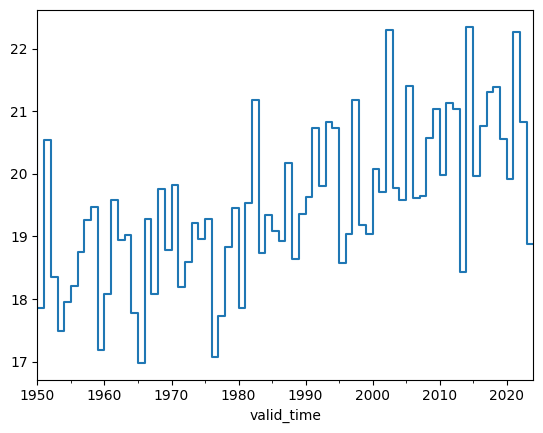

In [ ]:
#2.9
# Software

# deze moet van 1950

cx_ts = (
    mean_climatology_gdf_intersected_temporal.set_index("valid_time")['t2m']
    .rolling(window=1).mean()
    .loc[lambda s: s.index.month.isin([6,7,8])]
    .resample("AS-JAN").max()
)


cx_ts.plot(drawstyle = "steps")

In [ ]:
#2.10
# read station data time series from .xls
xls_station_data = pd.ExcelFile("../data/example.xlsx")
print(xls_station_data.sheet_names)   # list available sheets
xls_station_data_sheet1 = pd.read_excel(xls_station_data, "Sheet1")
xls_station_data_sheet2 = pd.read_excel(xls_station_data, "Sheet2")

FileNotFoundError: [Errno 2] No such file or directory: '../data/example.xlsx'

c:\Python310\lib\site-packages\geopandas\geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Text(0.5, 1.0, 'Mean temperature anomaly 2024-07-03')

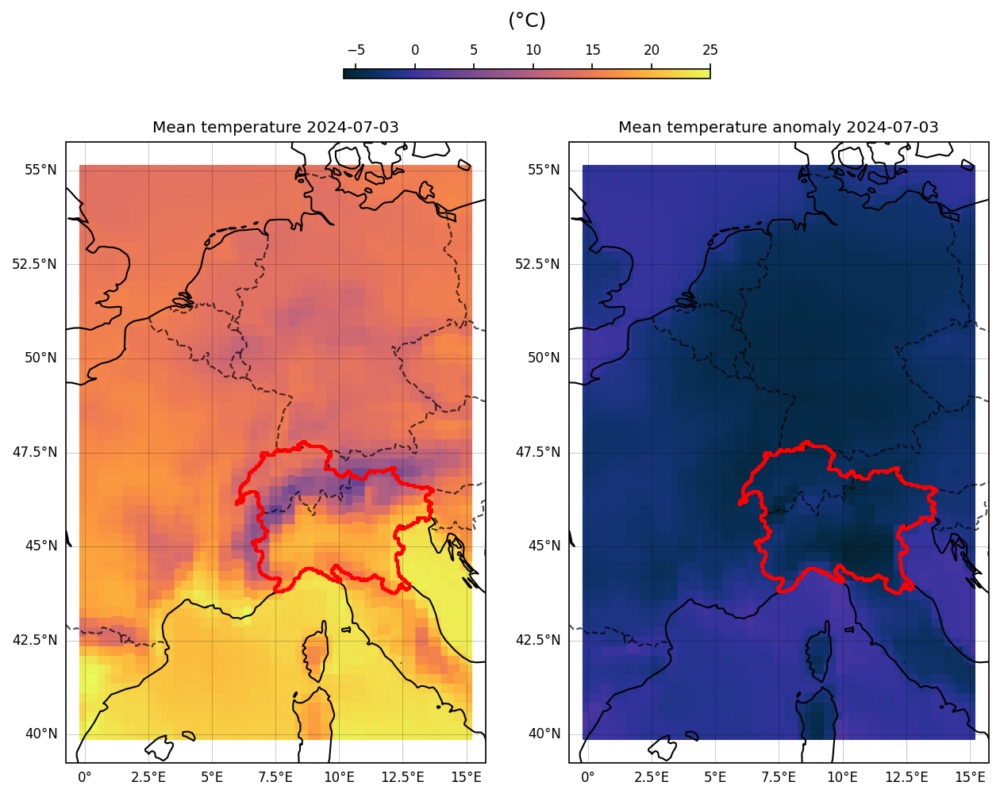

In [ ]:
#2.11 - Making it work with subplot_gdf function from our library
# this is intended to be a figure that will be published on the factsheet, so it should be the larger domain, that the user has specified earlier on, which incorporates the study domain which should be outlined
selected_date = datetime(2024,7,3)

# so this is just the a single day of the event with its anomoly
gdf_selected_intersect = event_gdf[(event_gdf['valid_time'] >= selected_date) & (event_gdf['valid_time'] <= selected_date)] #.overlay(poly_gdf, how='intersection')
gdf_select_intersect_anomoly = event_gdf_anomaly[(event_gdf_anomaly['valid_time'] >= selected_date) & (event_gdf_anomaly['valid_time'] <= selected_date)] #.overlay(poly_gdf, how='intersection')

# we cheat this for now because the subplots are split based on date, so we just move the anomoly to the next day
gdf_select_intersect_anomoly['valid_time'] = pd.to_datetime(gdf_select_intersect_anomoly["valid_time"]) + pd.Timedelta(days=1)

gdf_selected_intersect = pd.concat([gdf_selected_intersect, gdf_select_intersect_anomoly], ignore_index=True)

minx, miny, maxx, maxy = gdf_selected_intersect.total_bounds
dx = (maxx - minx) * 0.5   # 10% of width
dy = (maxy - miny) * 0.5   # 10% of height
expanded_extent = [minx - dx, maxx + dx, miny - dy, maxy + dy]

# create subplot using first gdf
fig, axes = subplot_gdf(
    gdf_selected_intersect,
    #title=f"Mean temperature {event_date.strftime('%Y-%m-%d')}",
    legend_title="(°C)",
    value_col='t2m',
    cmap=cmocean.cm.thermal,
    ncols=2,
    figsize=(10,10),
    flatten_empty_plots=False,
    #extends=expanded_extent,
    marker='s',
    dpi=150,
    polygons=polygons
)
axes[0].set_title(f"Mean temperature {selected_date.strftime('%Y-%m-%d')}")
axes[1].set_title(f"Mean temperature anomaly {selected_date.strftime('%Y-%m-%d')}")

2.12	Write a paragraph on the event definition in the scientific report Section 1.

In [ ]:
# 2.13 functions
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors as colors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_z500_gdf(z500, gdf, datetime_col:str="valid_time", value_col:str="t2m",
                  nrows:int=3, ncols:int=5, z_lev_steps:int=200, dpi:int=300,
                  projection:cartopy.crs=ccrs.PlateCarree(), cmap:str="RdYlBu_r"):
    """
    Plot daily values from a GeoDataFrame with Z500 contours from xarray.

    Parameters
    ----------
    z500 : xarray.DataArray
        500 hPa geopotential height (time, lat, lon)
    gdf : geopandas.GeoDataFrame
        Must contain datetime column and geometry + values
    datetime_col : str, default="valid_time"
        Name of the datetime column in gdf
    value_col : str, default="t2m"
        Name of the value column in gdf (e.g. temperature in °C)
    nrows, ncols : int
        Layout of subplots
    """

    # Figure setup
    aspect_ratio = 4 / 3
    subplot_width = 6
    subplot_height = subplot_width / aspect_ratio
    figsize = (ncols * subplot_width, nrows * subplot_height)
    fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=dpi)

    # Levels for GDF values
    vmin, vmax = gdf[value_col].min(), gdf[value_col].max()
    val_lev = np.arange(round(vmin), round(vmax) + 2, 2)  # step of 2
    norm1 = colors.BoundaryNorm(boundaries=val_lev, ncolors=256)

    # Levels for Z500
    zmin, zmax = float(z500.min()), float(z500.max())
    z_lev = np.arange(round(zmin), round(zmax), z_lev_steps)

    # Font + projection
    matplotlib.rcParams.update({'font.size': 8})


    # this projection is also used
    mid_lon_idx = len(z500.lon) // 2
    mid_lon = z500.lon.values[mid_lon_idx]
    mid_lat_idx = len(z500.lat) // 2
    mid_lat = z500.lat.values[mid_lat_idx]

    if abs(z500.lat.data.min()) > 30:
        proj = ccrs.LambertConformal(central_longitude=mid_lon, central_latitude=mid_lat)
    else:
        proj = projection

    # Loop over timesteps
    for i, t in enumerate(z500.time.values):
        ax = plt.subplot(nrows, ncols, i + 1, projection=proj)

        # --- Values from GeoDataFrame ---
        gdf_day = gdf[gdf[datetime_col] == np.datetime64(t)]
        gdf_day.plot(
            column=value_col, cmap=cmap, norm=norm1,
            ax=ax, transform=projection,
            legend=False
        )

        # --- Z500 contours from xarray ---
        cn = ax.contour(
            z500.lon, z500.lat, z500.sel(time=t),
            z_lev, colors="dimgray", linewidths=0.5,
            transform=projection
        )
        plt.clabel(cn, inline=1, fontsize=6)

        # Map features
        ax.set_title(str(np.datetime_as_string(t, unit="D")), loc="left", fontsize=7)
        ax.coastlines(resolution="50m", color="black", linewidth=0.5, alpha=0.7)
        ax.add_feature(cfeature.BORDERS, lw=0.5, alpha=0.7, color="black")

        gl = ax.gridlines(draw_labels=True, x_inline=False, y_inline=False,
                          linewidth=0.2, color="k", alpha=0.4)
        gl.right_labels = gl.top_labels = False
        gl.xlabel_style = {"size": 6, "color": "gray"}
        gl.ylabel_style = {"size": 6, "color": "gray"}

    # Shared colorbar
    left, bottom, width, height = [0.3, -0.04, 0.48, 0.015]
    cax = fig.add_axes([left, bottom, width, height])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm1)
    fig.colorbar(sm, cax=cax, boundaries=val_lev,
                 orientation="horizontal", extend="both", label=value_col)

    fig.suptitle(f"ERA5 Z500 and {value_col}", y=1.04, fontsize=14)
    #fig.tight_layout(rect=[0, 0.05, 1, 0.95])

    return fig


# this projection is also used
# mid_lon_idx = len(z500.lon) // 2
# mid_lon = z500.lon.values[mid_lon_idx]
# mid_lat_idx = len(z500.lat) // 2
# mid_lat = z500.lat.values[mid_lat_idx]

# if abs(z500.lat.data.min()) > 30:
#     proj = ccrs.LambertConformal(central_longitude=mid_lon, central_latitude=mid_lat)

In [ ]:
# 2.13 temp

# Load Z500 data (xarray)
ds_z500  = wrap_lon(xr.open_dataset("../data/era5_z500_daily_20250701_20250731.nc"))

z500_test_date_end = datetime(2025, 7, 20)
z500_test_date_start = z500_test_date_end - timedelta(days=14)

z500 = ds_z500.z500.sel(time=slice(z500_test_date_start, z500_test_date_end), lon=slice(bbox[0],bbox[2]), lat=slice(bbox[1],bbox[3]))
ds_z500.close()


z500_gdf = DataClient(your_api_key, beacon_cache_url='https://beacon-development.maris.nl').temperature_2m_mean(bbox, (z500_test_date_start, z500_test_date_end))
#z500_gdf = climatology_gdf_1950_event[(climatology_gdf_1950_event['valid_time'] >= z500_test_date_start) & (climatology_gdf_1950_event['valid_time'] <= z500_test_date_end)]

2025-09-03 09:00:21,446 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.


Connected to: https://beacon-development.maris.nl/ server successfully
Connected to: https://beacon-development.maris.nl/ server successfully
Fetching data from beacon cache...
Beacon Bbox: (0.0, 40, 15.0, 55)
Running query: {"from": "era5_daily_mean_2m_temperature", "select": [{"column": "longitude", "alias": null}, {"column": "latitude", "alias": null}, {"column": "valid_time", "alias": null}, {"column": "t2m", "alias": null}], "filters": [{"and": [{"column": "longitude", "gt_eq": 0.0, "lt_eq": null}, {"column": "longitude", "gt_eq": null, "lt_eq": 15.0}, {"column": "latitude", "gt_eq": 40, "lt_eq": null}, {"column": "latitude", "gt_eq": null, "lt_eq": 55}]}, {"column": "valid_time", "gt_eq": "2025-07-06T00:00:00.000000", "lt_eq": "2025-07-20T00:00:00.000000"}], "output": {"format": "parquet"}}
Beacon cache covers time range: 2025-07-06 00:00:00 - 2025-07-20 00:00:00


c:\Python310\lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Python310\lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Python310\lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Python310\lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Python310\lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecol

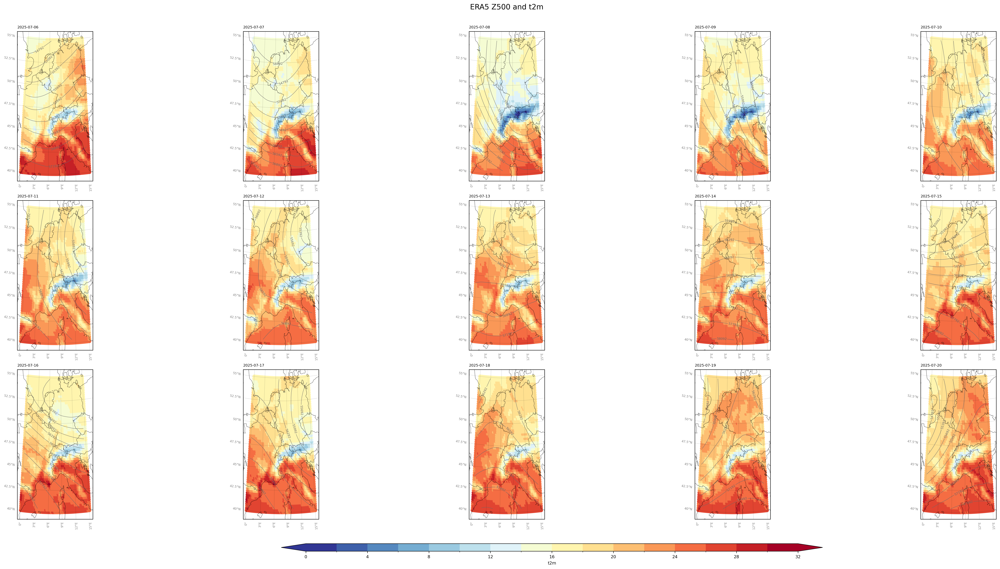

In [ ]:
fig = plot_z500_gdf(z500, z500_gdf, nrows=3, ncols=5, z_lev_steps=300)

In [ ]:
#2.13
# unclear requirements
# Software
# this is to aid the writing process but can still be part of the same notebook. For discussion: shouldn't this come before the event definition procedure? It makes sense to have an idea of the development before making a decision on the event definition.

2.14 Describe the event and meteorology in the scientific report Introduction,

    a. Describe meteorological situation, using maps created in Step 2.13 
       and the event maps created in Step 2.11

    b. Use information from seasonality

    c. Placeholder step to include a more elaborate event description 
       by C3S, based on event monitoring

    d. Placeholder step to include a more elaborate event description 
       by local NMS

In [ ]:
#2.15
# unclear requirements

TESTS

In [ ]:
def ddn_day_accumulations_gdf(
    gdf: Union[pd.DataFrame, gpd.GeoDataFrame],
    value_col: str,
    padding: int,
    centering: bool = False,
    datetime_col: str = "valid_time",
    method: Literal["sum", "mean", "std", "quantile"] = "mean",
    quantile: float = 0.9,
    group_by: list[str] = None
):
    """
    Compute rolling n-day statistics (sum, mean, std, quantile) for each point
    or globally.

    Parameters
    ----------
    gdf : GeoDataFrame or DataFrame
        Input data.
    value_col : str
        Column to roll (e.g. 't2m', 'tp').
    padding : int
        Window size in days.
    centering : bool
        Center the window.
    datetime_col : str
        Column with datetimes.
    method : {"sum", "mean", "std", "quantile"}
        Rolling aggregation method.
    quantile : float, optional
        Quantile to compute if method="quantile".
    group_by : list[str], optional
        Columns to group by before rolling. If None, roll globally.

    Returns
    -------
    DataFrame or GeoDataFrame
        Same as input, with rolled values in `value_col`.
    """

    gdf = gdf.copy()
    gdf[datetime_col] = pd.to_datetime(gdf[datetime_col])

    # remove leap days for consistent rolling
    gdf = gdf[~((gdf[datetime_col].dt.month == 2) & (gdf[datetime_col].dt.day == 29))]

    if group_by is None:
        group_by = []  # roll globally

    def apply_roll(group):
        roller = group.set_index(datetime_col)[value_col].rolling(
            window=padding, min_periods=1, center=centering
        )
        if method == "sum":
            rolled = roller.sum()
        elif method == "mean":
            rolled = roller.mean()
        elif method == "std":
            rolled = roller.std()
        elif method == "quantile":
            rolled = roller.quantile(quantile)
        else:
            raise ValueError(f"Unsupported method: {method}")

        group[value_col] = rolled.values
        return group

    if group_by:
        # rolling separately for each group (e.g. per lat/lon/geometry)
        result = gdf.groupby(group_by, group_keys=False).apply(apply_roll)
    else:
        # single global time series
        roller = gdf.set_index(datetime_col)[value_col].rolling(
            window=padding, min_periods=1, center=centering
        )
        if method == "sum":
            rolled = roller.sum()
        elif method == "mean":
            rolled = roller.mean()
        elif method == "std":
            rolled = roller.std()
        elif method == "quantile":
            rolled = roller.quantile(quantile)
        else:
            raise ValueError(f"Unsupported method: {method}")

        result = rolled.reset_index()  # only datetime + value

    # preserve GeoDataFrame type if input was GeoDataFrame
    if isinstance(gdf, gpd.GeoDataFrame):
        return gpd.GeoDataFrame(result, geometry="geometry", crs=gdf.crs)
    return result

In [ ]:
# testing mean padding

def sliding_stat_by_dayofyear(data, pad=15, method='mean', quantile_val=0.9):
    """
    Compute day-of-year-based sliding window statistics (mean, std, or quantile) across years.
 
    Parameters:
    -----------
    data : xr.DataArray
        3D DataArray with dimensions ('time', 'lat', 'lon')
    pad : int
        Number of days on either side to include in the window (default: 15 → 30-day window)
    method : str
        Statistic to compute: 'std', 'mean', or 'quantile'
    quantile_val : float
        Quantile to compute if method='quantile' (e.g., 0.9 for 90th percentile)
 
    Returns:
    --------
    xr.DataArray
        DataArray of shape (dayofyear, lat, lon) with the selected statistic
        Each [d, :, :] slice contains the 30-day std around day d, computed across all years.
    """
 
    # Sanity check
    if method not in ['std', 'mean', 'quantile']:
        raise ValueError("method must be one of: 'std', 'mean', 'quantile'")
 
    # Remove Feb 29 to standardize 365-day calendar
    #data = data.sel(time=~((data.time.dt.month == 2) & (data.time.dt.day == 29)))
 
    # Ensure 'time' column is datetime
    data['valid_time'] = pd.to_datetime(data['valid_time'])
 
    # Boolean mask: keep all rows NOT Feb 29
    mask = ~((data['valid_time'].dt.month == 2) & (data['valid_time'].dt.day == 29))
 
    # Apply mask
    data = data[mask]
 
    days = np.arange(1, 366)  # Days of year
 
    #dayofyear = data.valid_time.dt.dayofyear
 
    data['doy'] = data['valid_time'].dt.dayofyear
 
    data['longitude'] = data.geometry.x
    data['latitude'] = data.geometry.y
 
    result_list = []

    # print all rows where data['doy'] == 61
    print(data[data["doy"] == 61])

    for day in days:
        # Build ±pad-day window (cyclically)
        window_days = [(day + offset - 1) % 365 + 1 for offset in range(-pad, pad + 1)]
       
        #mask = dayofyear.isin(window_days)
        #window_data = data.sel(time=mask)
 
        window_data = data[data['doy'].isin(window_days)]
 
        # Compute mean at each location
        daily_mean = (
            window_data.groupby(['longitude', 'latitude'])['t2m']
            .mean()
            .reset_index()
        )
       
        daily_mean['doy'] = day
        result_list.append(daily_mean)
        doy_mean_gdf = pd.concat(result_list, ignore_index=True)
 
        # # Compute selected statistic
        # if method == 'std':
        #     stat = window_data.std(dim='valid_time')
        # elif method == 'mean':
        #     stat = window_data.mean()
        # elif method == 'quantile':
        #     stat = window_data.quantile(quantile_val, dim='valid_time')
       
        #result_list.append(stat)
 
    # Combine results
    #result = xr.concat(result_list, dim='dayofyear')
    #result = result.assign_coords(dayofyear=days)
 
    return doy_mean_gdf

In [ ]:
days = np.arange(1, 366)  # Days of year

 
for day in days:
    # Build ±pad-day window (cyclically)
    window_days = [(day + offset - 1) % 365 + 1 for offset in range(-15, 15 + 1)]

    if(day == 16):
        print(day, window_days)

date = datetime(2024, 7, 16)
start = date - timedelta(days=15)
end = date + timedelta(days=15)

print(start, end)

16 [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31)]
2024-07-01 00:00:00 2024-07-31 00:00:00


In [ ]:
test_gdf = climatology_gdf_1950_event[(climatology_gdf_1950_event['valid_time'] >= datetime(1991,1,1)) & (climatology_gdf_1950_event['valid_time'] <= datetime(2020,12,31))]

In [ ]:
mean_jas = calculate_mean_gdf(test_gdf, date_range=pd.date_range(start, date), padding=15, value_col='t2m', datetime_col='valid_time')

In [ ]:
mean_izi = sliding_stat_by_dayofyear(test_gdf, pad=15, method='mean')

c:\Python310\lib\site-packages\geopandas\geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
c:\Python310\lib\site-packages\geopandas\geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


          longitude  latitude valid_time        t2m          geometry  doy
54589553       10.0     50.75 1991-03-02   1.710724  POINT (10 50.75)   61
54589552       10.0     50.50 1991-03-02   1.095734   POINT (10 50.5)   61
54589551       10.0     50.25 1991-03-02   1.401062  POINT (10 50.25)   61
54589550       10.0     50.00 1991-03-02   2.112335     POINT (10 50)   61
54589544       10.0     48.50 1991-03-02   1.993835   POINT (10 48.5)   61
...             ...       ...        ...        ...               ...  ...
94001142        5.0     45.00 2020-03-01   9.700134      POINT (5 45)   61
94001141        5.0     44.75 2020-03-01   9.193481   POINT (5 44.75)   61
94001140        5.0     44.50 2020-03-01   9.527527    POINT (5 44.5)   61
94001139        5.0     44.25 2020-03-01  10.163361   POINT (5 44.25)   61
94001143        5.0     45.25 2020-03-01   9.291534   POINT (5 45.25)   61

[111630 rows x 6 columns]


In [ ]:

mean_rol = ddn_day_accumulations_gdf(gdf = test_gdf, value_col='t2m', datetime_col='valid_time', padding=31, centering=True, method='mean', group_by=['latitude', 'longitude', 'geometry'])

C:\Users\jasper\AppData\Local\Temp\ipykernel_9984\155280590.py:68: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = gdf.groupby(group_by, group_keys=False).apply(apply_roll)


In [ ]:
doy_mean_gdf = gpd.GeoDataFrame(
    mean_izi,
    geometry=gpd.points_from_xy(mean_izi.longitude, mean_izi.latitude),
    crs=test_gdf.crs
)
 
doy_mean_gdf['valid_time'] = pd.to_datetime('2025', format='%Y') + pd.to_timedelta(doy_mean_gdf['doy'] - 1, unit='D')

print(doy_mean_gdf)

# mean_rol group by day of year and average
mean_rol['doy'] = mean_rol['valid_time'].dt.dayofyear
mean_rol2 = mean_rol.groupby(['doy', 'latitude', 'longitude', 'geometry'])['t2m'].mean().reset_index()
mean_rol2['valid_time'] = pd.to_datetime('2025', format='%Y') + pd.to_timedelta(mean_rol2['doy'] - 1, unit='D')


print(mean_rol2)

         longitude  latitude        t2m  doy          geometry valid_time
0              0.0     40.00  10.704597    1      POINT (0 40) 2025-01-01
1              0.0     40.25   8.070921    1   POINT (0 40.25) 2025-01-01
2              0.0     40.50   6.170944    1    POINT (0 40.5) 2025-01-01
3              0.0     40.75   6.015360    1   POINT (0 40.75) 2025-01-01
4              0.0     41.00   7.048646    1      POINT (0 41) 2025-01-01
...            ...       ...        ...  ...               ...        ...
1358160       15.0     54.00   1.643255  365     POINT (15 54) 2025-12-31
1358161       15.0     54.25   2.505117  365  POINT (15 54.25) 2025-12-31
1358162       15.0     54.50   3.078517  365   POINT (15 54.5) 2025-12-31
1358163       15.0     54.75   3.306570  365  POINT (15 54.75) 2025-12-31
1358164       15.0     55.00   3.298994  365     POINT (15 55) 2025-12-31

[1358165 rows x 6 columns]
         doy  latitude  longitude          geometry        t2m valid_time
0         

In [ ]:
# select month june 2000
mean_rol2 = mean_rol[(mean_rol['valid_time'] >= datetime(2000,6,1)) & (mean_rol['valid_time'] <= datetime(2000,6,30))]
mean_izi2 = mean_izi.groupby(['valid_time', 'doy'])

print(mean_izi2)
print(mean_rol2)

        longitude  latitude        t2m  doy
561871        0.0     40.00  20.382896  152
561872        0.0     40.25  18.887320  152
561873        0.0     40.50  17.471142  152
561874        0.0     40.75  17.883381  152
561875        0.0     41.00  19.866716  152
...           ...       ...        ...  ...
673496       15.0     54.00  17.034340  181
673497       15.0     54.25  16.488373  181
673498       15.0     54.50  16.046423  181
673499       15.0     54.75  15.801114  181
673500       15.0     55.00  15.611529  181

[111630 rows x 4 columns]
          longitude  latitude valid_time        t2m          geometry
67162813       10.0     51.00 2000-06-01  14.240805     POINT (10 51)
67162812       10.0     50.75 2000-06-01  14.204176  POINT (10 50.75)
67162811       10.0     50.50 2000-06-01  13.911044   POINT (10 50.5)
67162810       10.0     50.25 2000-06-01  14.470410  POINT (10 50.25)
67162804       10.0     48.75 2000-06-01  14.746423  POINT (10 48.75)
...             ...      

In [ ]:
print(mean_jas)

doy_mean_gdf = gpd.GeoDataFrame(
    mean_izi,
    geometry=gpd.points_from_xy(mean_izi.longitude, mean_izi.latitude),
    crs=test_gdf.crs
)
 
doy_mean_gdf = doy_mean_gdf[(doy_mean_gdf['doy'] >= 182) & (doy_mean_gdf['doy'] <= 196)]
doy_mean_gdf['valid_time'] = pd.to_datetime('2025', format='%Y') + pd.to_timedelta(doy_mean_gdf['doy'] - 1, unit='D')
#drop the doy column
doy_mean_gdf = doy_mean_gdf.drop(columns=['doy'])

print(doy_mean_gdf)

# take the mean of every day over the entire period

print(mean_rol)

       longitude  latitude          geometry        t2m valid_time
0            0.0     40.00      POINT (0 40)  23.870359 2024-07-01
1            0.0     40.25   POINT (0 40.25)  22.495413 2024-07-01
2            0.0     40.50    POINT (0 40.5)  21.348719 2024-07-01
3            0.0     40.75   POINT (0 40.75)  21.955032 2024-07-01
4            0.0     41.00      POINT (0 41)  23.961277 2024-07-01
...          ...       ...               ...        ...        ...
59531       15.0     54.00     POINT (15 54)  18.421694 2024-07-16
59532       15.0     54.25  POINT (15 54.25)  17.973639 2024-07-16
59533       15.0     54.50   POINT (15 54.5)  17.613714 2024-07-16
59534       15.0     54.75  POINT (15 54.75)  17.417173 2024-07-16
59535       15.0     55.00     POINT (15 55)  17.256437 2024-07-16

[59536 rows x 5 columns]
        longitude  latitude        t2m          geometry valid_time
673501        0.0     40.00  23.854944      POINT (0 40) 2025-07-01
673502        0.0     40.25  22.47